TODO:
    

The submission shows that the student applied appropriate techniques to build predictive models.

The submission shows that the student applied steps to build predictive models for the data in their capstone project. 

The submission shows that a hypothesis was developed.

The submission includes a  justification of the machine learning technique, and features selection and evaluation 
metrics/techniques utilized.

In [1]:
ls -ltrh ../Data/ice

total 19M
-rw-rw-r-- 1 test test 2,3M oct 24 13:58 N_seaice_extent_daily_v3.0.csv
-rw-rw-r-- 1 test test 2,3M oct 24 14:03 S_seaice_extent_daily_v3.0.csv
-rw-rw-r-- 1 test test 3,3M oct 25 12:14 Sea_Ice_Index_Regional_Daily_Data_G02135_v3.0.xlsx
-rw-rw-r-- 1 test test 4,6M dec  2 15:00 ice_final.csv
-rw-rw-r-- 1 test test  39K dec  2 15:15 temp_df1.csv
-rw-rw-r-- 1 test test 202K dec  2 15:15 temp_df2.csv
-rw-rw-r-- 1 test test 6,1M ian 15 10:54 ice_and_co2.csv


In [2]:
ls -ltrh ../Data/co2

total 136K
-rw-rw-r-- 1 test test 30K nov 21 10:36 co2_mm_mlo.csv
-rw-rw-r-- 1 test test 27K nov 25 11:40 CO2_final.csv
-rw-rw-r-- 1 test test 71K nov 27 15:14 CO2_0000-2014.csv
-rw-rw-r-- 1 test test 634 dec  2 15:02 CO2_diff.csv


In [3]:
ls -ltrh ../Data/fire/*.csv

-rw-rw-r-- 1 test test 50M nov 25 11:36 ../Data/fire/fire_M6_final.csv
-rw-rw-r-- 1 test test 86M nov 25 11:38 ../Data/fire/fire_V1_final.csv


In [4]:
import numpy as np
import scipy as sp
import pandas as pd
from datetime import datetime as dt
import time
import random
import sklearn.model_selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from scipy.stats import norm, poisson, t
from statsmodels.formula.api import ols
import statsmodels.api as sm
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
import seaborn as sns
%matplotlib inline

In [5]:
# Load fire data
fire_M6 = pd.read_csv('../Data/fire/fire_M6_final.csv', index_col = False)
fire_V1 = pd.read_csv('../Data/fire/fire_V1_final.csv', index_col = False)

In [6]:
fire_M6.head(3)

,latitude,longitude,acq_date,frp,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,48.5844,133.8742,2000-11-01,88.4,0.06736,297.40,False,True,False
1,-12.7627,136.3999,2000-11-01,45.7,0.07847,310.75,False,True,False
2,-18.9486,128.7469,2000-11-01,15.1,0.07986,329.40,False,True,False


In [7]:
fire_V1.head(3)

,latitude,longitude,acq_date,frp,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,10.85186,15.22319,2012-01-31,0.9,0.05208,291.40,False,True,False
1,9.86889,4.71216,2012-01-31,1.0,0.05278,300.85,False,True,False
2,9.96840,4.39155,2012-01-31,0.6,0.05278,297.15,False,True,False


In [8]:
# Load CO2 data
CO2=pd.read_csv('../Data/co2/CO2_final.csv', index_col = False)
CO2.head(3)

,Year,Month,decimal_date,CO2_ppm,trend
0,1958,3,1958.208,315.71,314.62
1,1958,4,1958.292,317.45,315.29
2,1958,5,1958.375,317.50,314.71


In [9]:
CO2_diff = pd.read_csv('../Data/co2/CO2_diff.csv', index_col = False)
CO2_diff.columns = ['Year', 'CO2_difference']
CO2_diff.head(3)

,Year,CO2_difference
0,1958,4.84
1,1959,5.03
2,1960,6.20


In [10]:
# Load ice data
ice = pd.read_csv('../Data/ice/ice_final.csv', index_col = False)
ice = ice.set_index('Unnamed: 0')
ice.index.name = None
# use shorter names
ice.columns = ['Baffin', 'Baffin-ext', 'Barents-ext', 'Beaufort', 'Barents', 'Beaufort-ext',
'Bering', 'Bering-ext', 'Canadian', 'Canadian-ext', 'Central-Arctic', 'Central-Arctic-ext',
'Chukchi', 'Chukchi-ext', 'East-Siberian', 'East-Siberian-ext', 'Greenland', 'Greenland-ext',
'Hudson', 'Hudson-ext', 'Kara', 'Kara-ext', 'Laptev', 'Laptev-ext', 'Okhotsk', 'Okhotsk-ext',
'St-Lawrence', 'St-Lawrence-ext', 'North_ext', 'South_ext']
ice.head(3)

,Baffin,Baffin-ext,Barents-ext,Beaufort,Barents,Beaufort-ext,Bering,Bering-ext,Canadian,Canadian-ext,...,Kara,Kara-ext,Laptev,Laptev-ext,Okhotsk,Okhotsk-ext,St-Lawrence,St-Lawrence-ext,North_ext,South_ext
1978-10-28,416908.720,521862.289,361743.416,895310.805,222781.361,940219.39,11472.805,35555.883,719220.320,761228.252,...,569610.622,815398.750,802884.363,872414.226,16799.581,35135.582,0.0,0.0,10.4200,17.8030
1978-10-29,416908.720,521862.289,361743.416,895310.805,222781.361,940219.39,11472.805,35555.883,719220.320,761228.252,...,569610.622,815398.750,802884.363,872414.226,16799.581,35135.582,0.0,0.0,10.4885,17.7365
1978-10-30,419829.102,531533.703,379395.172,894088.098,229769.256,940219.39,13553.099,42670.305,717303.629,761228.252,...,562328.391,816017.367,806760.991,872414.226,18745.308,39102.698,0.0,0.0,10.5570,17.6700


In [11]:
"""
Inputs:  date, string format: YYYY-MM-DD
Outputs: date, float format
"""
def toYearFraction(date):
    date = dt.strptime(date, '%Y-%m-%d')
    def sinceEpoch(date): # returns seconds since epoch
        return time.mktime(date.timetuple())
    s = sinceEpoch

    year = date.year
    startOfThisYear = dt(year=year, month=1, day=1)
    startOfNextYear = dt(year=year+1, month=1, day=1)

    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration

    return date.year + fraction

In [12]:
# Load ice and CO2 data
ice_and_co2 = pd.read_csv('../Data/ice/ice_and_co2.csv')
ice_and_co2.set_index(ice_and_co2.columns[0], inplace=True)
ice_and_co2.index.name = None
ice_and_co2_original = ice_and_co2.copy()

# Add a decimal date for ice_and_co2 dataframe, for regression purposes

ice_and_co2['decimal_date'] = list(map(lambda x: toYearFraction(x), list(ice_and_co2.index)))

In [13]:
ice_and_co2.head(3)

,North_ext,Chukchi,Chukchi-ext,Kara,Kara-ext,Baffin,Baffin-ext,Canadian,Canadian-ext,Hudson,...,Okhotsk-ext,St-Lawrence,St-Lawrence-ext,Central-Arctic,Central-Arctic-ext,South_ext,North_and_South,CO2_ppm,trend,decimal_date
1978-10-28,10.4200,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.8030,28.223,332.971935,335.81,1978.821918
1978-10-29,10.4885,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.7365,28.225,333.015161,335.82,1978.824658
1978-10-30,10.5570,520961.376,624383.567,562328.391,816017.367,419829.102,531533.703,717303.629,761228.252,261666.759,...,39102.698,0.0,0.0,1859850.012,3224681.689,17.6700,28.227,333.058387,335.83,1978.827397


In [14]:
ice_and_co2.columns

Index(['North_ext', 'Chukchi', 'Chukchi-ext', 'Kara', 'Kara-ext', 'Baffin',
       'Baffin-ext', 'Canadian', 'Canadian-ext', 'Hudson', 'Hudson-ext',
       'Greenland', 'Greenland-ext', 'Laptev', 'Laptev-ext', 'Beaufort',
       'Beaufort-ext', 'East-Siberian', 'East-Siberian-ext', 'Barents',
       'Barents-ext', 'Bering', 'Bering-ext', 'Okhotsk', 'Okhotsk-ext',
       'St-Lawrence', 'St-Lawrence-ext', 'Central-Arctic',
       'Central-Arctic-ext', 'South_ext', 'North_and_South', 'CO2_ppm',
       'trend', 'decimal_date'],
      dtype='object')

CO2

The latest 20 years show an acceleration of the historical trend as shown below

In [15]:
sns.set_style("whitegrid")
sns.set_context("poster")

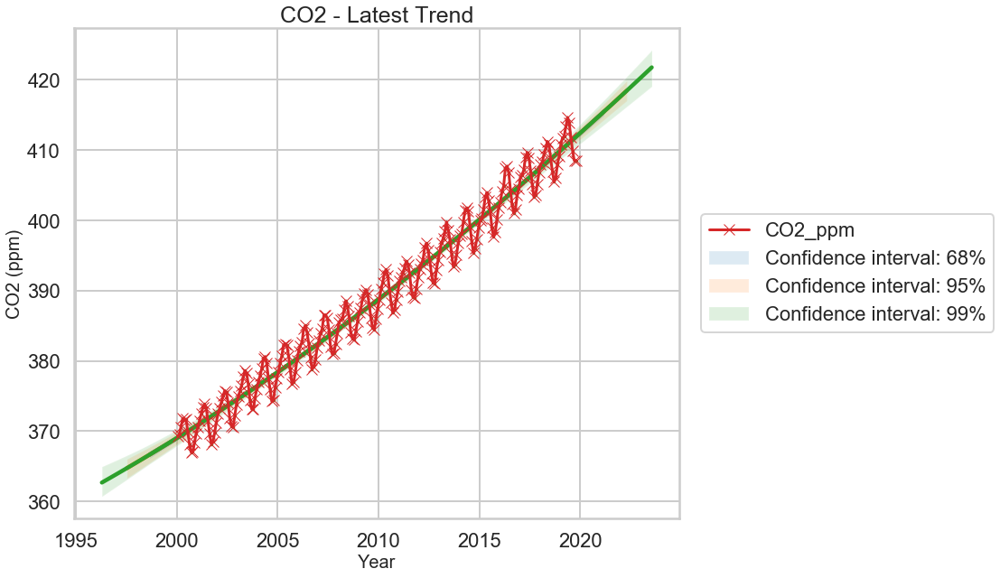

In [16]:
sd = {"sd1": 68.27, "sd2": 95.45, "sd3": 99.73}
detail_df=CO2[502:]
fig = plt.figure(figsize=(12, 10))
for sd_item in sd.keys():
    ax = sns.regplot(x='decimal_date', y='CO2_ppm', ci=sd[sd_item], data=detail_df, order=2, scatter_kws={'s':5})
plt.plot('decimal_date', 'CO2_ppm', data=detail_df, linestyle='-', marker='x')
plt.title('CO2 - Latest Trend', fontsize=25); plt.xlabel('Year', fontsize=20); plt.ylabel('CO2 (ppm)', fontsize=20)
ax.collections[1].set_label('Confidence interval: 68%')
ax.collections[3].set_label('Confidence interval: 95%')
ax.collections[5].set_label('Confidence interval: 99%')
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1)
plt.show()

In [17]:
ice_and_co2.head(3)

,North_ext,Chukchi,Chukchi-ext,Kara,Kara-ext,Baffin,Baffin-ext,Canadian,Canadian-ext,Hudson,...,Okhotsk-ext,St-Lawrence,St-Lawrence-ext,Central-Arctic,Central-Arctic-ext,South_ext,North_and_South,CO2_ppm,trend,decimal_date
1978-10-28,10.4200,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.8030,28.223,332.971935,335.81,1978.821918
1978-10-29,10.4885,512197.242,612396.111,569610.622,815398.750,416908.720,521862.289,719220.320,761228.252,246180.927,...,35135.582,0.0,0.0,1862320.419,3224681.689,17.7365,28.225,333.015161,335.82,1978.824658
1978-10-30,10.5570,520961.376,624383.567,562328.391,816017.367,419829.102,531533.703,717303.629,761228.252,261666.759,...,39102.698,0.0,0.0,1859850.012,3224681.689,17.6700,28.227,333.058387,335.83,1978.827397


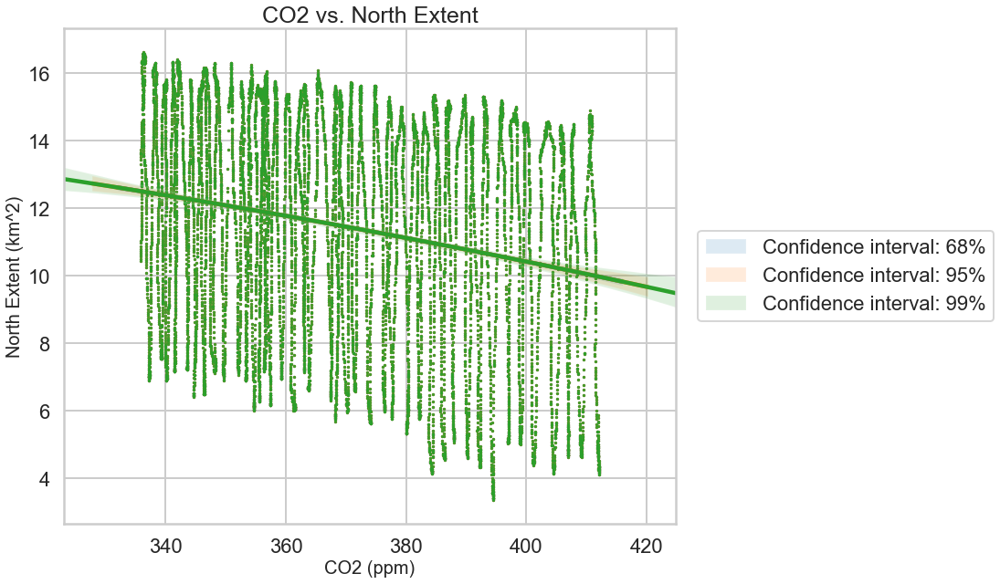

In [18]:
sd = {"sd1": 68.27, "sd2": 95.45, "sd3": 99.73}
detail_df=ice_and_co2[['North_ext', 'trend']]
fig = plt.figure(figsize=(12, 10))
for sd_item in sd.keys():
    ax = sns.regplot(x='trend', y='North_ext', ci=sd[sd_item], data=detail_df, order=2, scatter_kws={'s':5})
#plt.plot('decimal_date', 'CO2_ppm', data=detail_df, linestyle='-', marker='x')
plt.title('CO2 vs. North Extent', fontsize=25)
plt.xlabel('CO2 (ppm)', fontsize=20)
plt.ylabel('North Extent (km^2)', fontsize=20)
ax.collections[1].set_label('Confidence interval: 68%')
ax.collections[3].set_label('Confidence interval: 95%')
ax.collections[5].set_label('Confidence interval: 99%')
ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1)
plt.show()

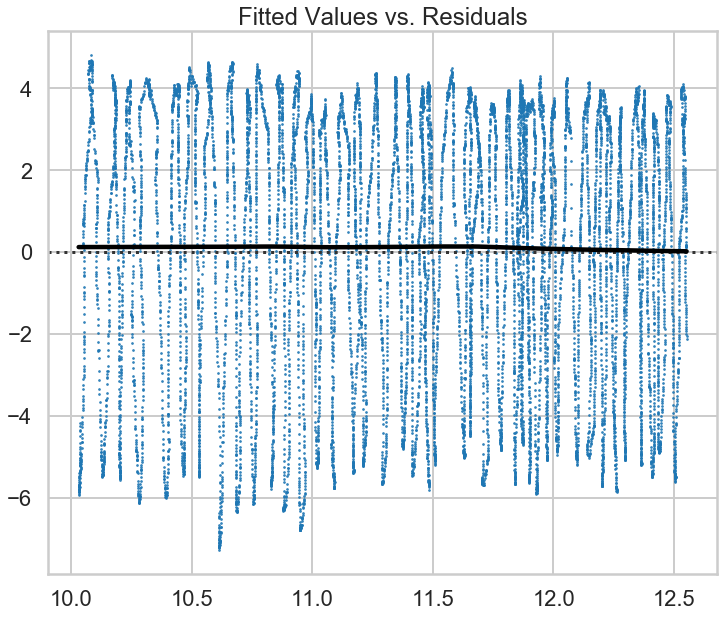

In [19]:
CO2_North_lm = ols('North_ext ~ trend', ice_and_co2).fit()

plt.figure(figsize=(12, 10))
plt.xlabel("Fitted Values")
plt.ylabel("Residual")
plt.title("Fitted Values vs. Residuals")
sns.residplot(CO2_North_lm.fittedvalues, CO2_North_lm.resid, lowess=True, 
              scatter_kws={"s": 3},
              line_kws={'color': 'black'})
plt.show()

In [20]:
# There is no obvious trend, therefore the order 1 linear correlation 'North_ext ~ trend'
# provides a good fit.

In [21]:
# ice_and_co2 - check if there is an anomaly for ice data
# similar to the 1990...1995 anomaly for CO2 data

Order2:
coef2= -0.0006918903260409839, coef1= 2.7071036348125905, intercept= -2635.168337863291



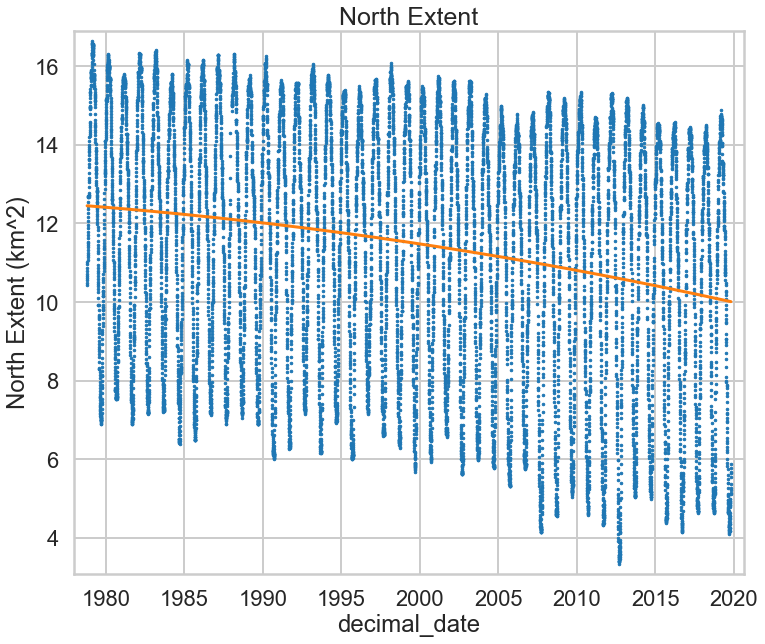

In [22]:
# North Extent

coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_and_co2['decimal_date'], y=ice_and_co2['North_ext'], deg=2)
print("Order2:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_2, coef1_2, intercept_2))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['North_ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('North Extent (km^2)')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_2 * x**2 + coef1_2 * x + intercept_2)
plt.plot(x,y)
plt.title('North Extent', fontsize=25)
plt.show()

Order2:
coef2= -89.3205117026325, coef1= 352382.59384552337, intercept= -346820127.3807691



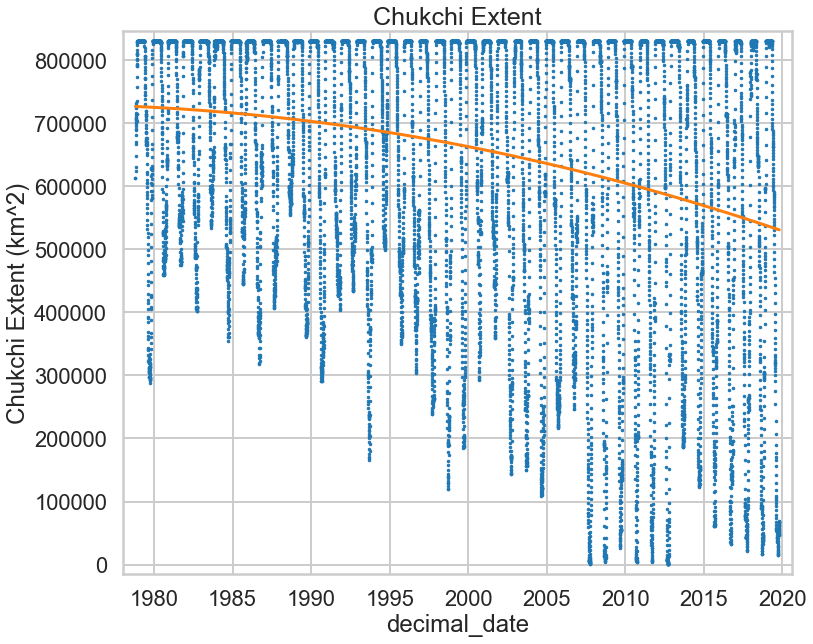

In [23]:
coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_and_co2['decimal_date'], y=ice_and_co2['Chukchi-ext'], deg=2)
print("Order2:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_2, coef1_2, intercept_2))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['Chukchi-ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('Chukchi Extent (km^2)')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_2 * x**2 + coef1_2 * x + intercept_2)
plt.plot(x,y)
plt.title('Chukchi Extent', fontsize=25)
plt.show()

Order2:
coef2= -2565.055099549131, coef1= 10305014.093550062, intercept= -10349249730.785421



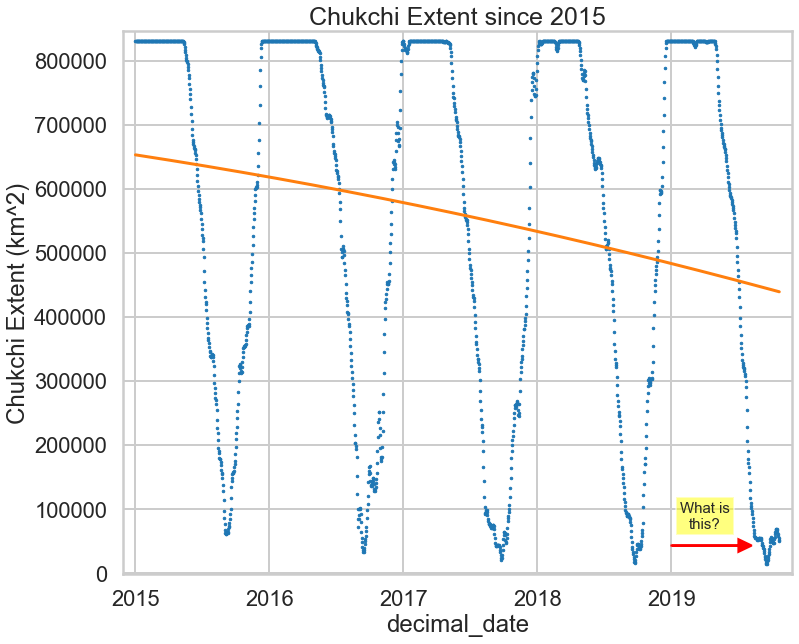

In [24]:
ice_2015 = ice_and_co2[ice_and_co2['decimal_date'] >= 2015]
coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_2015['decimal_date'], y=ice_2015['Chukchi-ext'], deg=2)
print("Order2:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_2, coef1_2, intercept_2))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_2015['decimal_date'], ice_2015['Chukchi-ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('Chukchi Extent (km^2)')

x = np.array(ice_2015['decimal_date'])
y = np.array(coef2_2 * x**2 + coef1_2 * x + intercept_2)
plt.plot(x,y)
plt.text(2019.25, 70000, 'What is\nthis?', horizontalalignment='center', fontsize=15,
        bbox=dict(facecolor='yellow', alpha=0.5))
plt.arrow(2019, 43000, 0.5, 0, length_includes_head=False, color='red', head_width=20000, head_length=0.1)
plt.title('Chukchi Extent since 2015', fontsize=25)
plt.show()

In [25]:
# Zooming in from 2015 to present for Chucki ice extent shows a very strange pattern change 
# for the end of 2019. Generally, the ice extent covers the whole sea during the winter for about 5 months
# and goes close to zero fro a brief period of time during the summer. 
# However, during the summer of 2019, the ice extent stayed close to zero for 2 months. 
# This has never happened before according to satellite data. The data is real, there are no errors.

# The 2019 Chukchi ice extent anomaly is outside the scope of this analyze.
# The purpose of this analyze is to check if the 1990...1995 CO2 anomaly 
# can be found for ice data as well.

In [26]:
ice_and_co2['period']=np.NaN
ice_and_co2.loc[ice_and_co2['decimal_date']<=1990, 'period']='before 1990'
ice_and_co2.loc[(ice_and_co2['decimal_date']>1990) & (ice_and_co2['decimal_date']<=1995), 'period']='1990...1995'
ice_and_co2.loc[ice_and_co2['decimal_date']>1995, 'period']='after 1995'

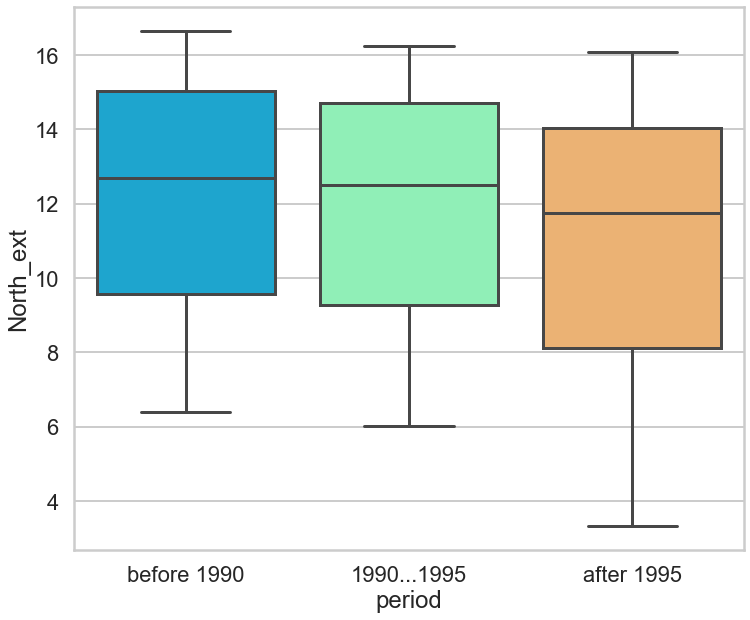

In [27]:
plt.figure(figsize=(12, 10))
sns.boxplot(data=ice_and_co2, x='period', y='North_ext', palette='rainbow')

In [28]:
# The 1990...1995 is present in ice data but it is not as obvious as for CO2 data

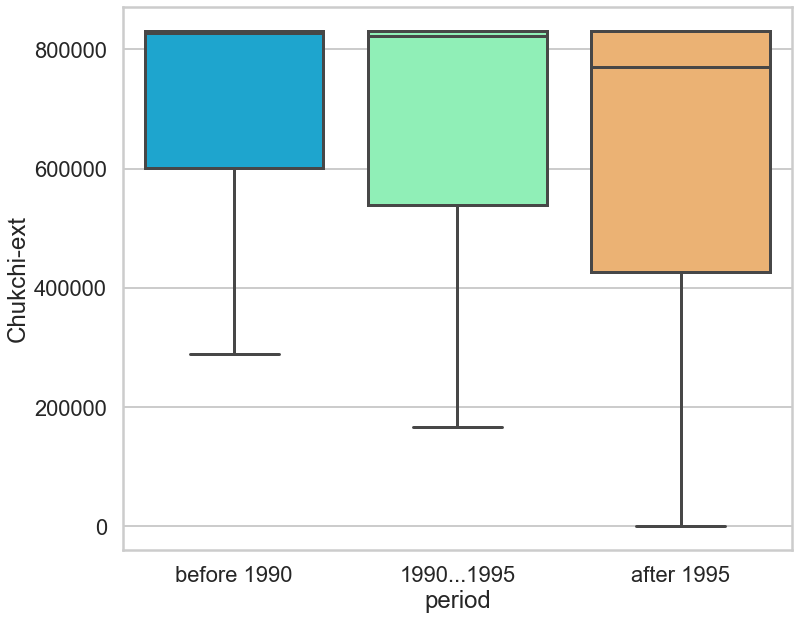

In [29]:
plt.figure(figsize=(12, 10))
sns.boxplot(data=ice_and_co2, x='period', y='Chukchi-ext', palette='rainbow')

In [30]:
# The boxplots for the 3 periods of time are different.
# After 1995 the first quartile is much lower than before for North extent and Chukchi extent
# For Chukchi extent, until 1995 the median was very close to the max sea extent.
# This means that ice was completely covering the sea for more than half of the time.
# Starting from 1995 this situation changed, the median is lower.

Order2, until 1990:
coef2= 0.002452328432492651, coef1= -9.820840062143699, intercept= 9843.74006173333



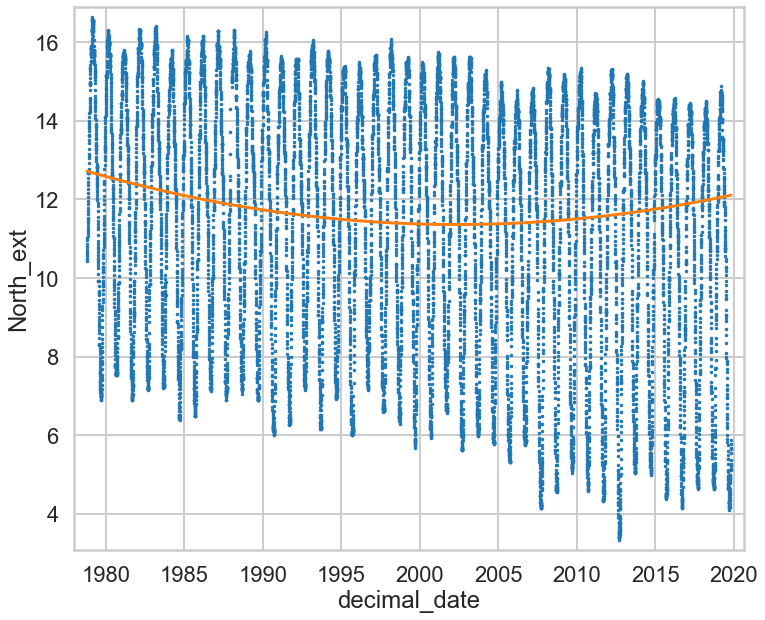

In [31]:
ice_and_co2_until_1990 = ice_and_co2[ice_and_co2['decimal_date'] <= 1990]
coef2_1990, coef1_1990, intercept_1990 = np.polyfit(x=ice_and_co2_until_1990['decimal_date'], 
                                                    y=ice_and_co2_until_1990['North_ext'], 
                                                    deg=2)
print("Order2, until 1990:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_1990, coef1_1990, intercept_1990))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['North_ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('North_ext')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_1990 * x**2 + coef1_1990 * x + intercept_1990)
plt.plot(x,y)
plt.show()

In [32]:
# By using only the ice data until 1990, the order 2 coefficient was positive.
# This is obviousely inconsistent with the overall trend for ice data shown above.
# The trend after 1990 (and 1995) contradicts the model fitted only with data before 1990.

Order2, until 1990:
coef2= 0.0004046561751922471, coef1= -1.7030076310161033, intercept= 1798.9580685293363



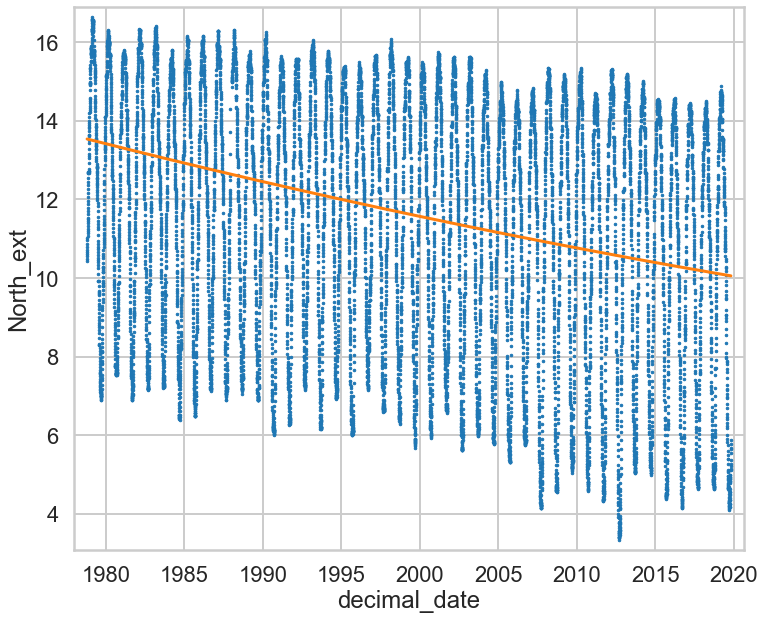

In [33]:
ice_and_co2_after_1995 = ice_and_co2[ice_and_co2['decimal_date'] > 1995]
#coef2_2, coef1_2, intercept_2 = np.polyfit(x=ice_and_co2['decimal_date'], y=ice_and_co2['North_ext'], deg=2)
coef2_1995, coef1_1995, intercept_1995 = np.polyfit(x=ice_and_co2_after_1995['decimal_date'], 
                                                    y=ice_and_co2_after_1995['North_ext'], 
                                                    deg=2)
print("Order2, until 1990:\ncoef2= {}, coef1= {}, intercept= {}\n".format(coef2_1995, coef1_1995, intercept_1995))

fig = plt.figure(figsize=(12, 10))
plt.plot(ice_and_co2['decimal_date'], ice_and_co2['North_ext'], marker='.', linestyle='none', ms=5)
plt.margins(0.02)
plt.xlabel('decimal_date')
plt.ylabel('North_ext')

x = np.array(ice_and_co2['decimal_date'])
y = np.array(coef2_1995 * x**2 + coef1_1995 * x + intercept_1995)
plt.plot(x,y)
plt.show()

In [34]:
# By using the ice data after 1995, the order 2 coefficient is still positive but very small.
# The data is clearly better interpolated in this case.

In [35]:
# In conclusion, by analyzing the ice extent and the CO2 level, the order 1 linear correlation
# overall results in a good 'fitted vs. residuals'.

Text(0.5, 1, '\nHeatmap: Ice and CO2\n')

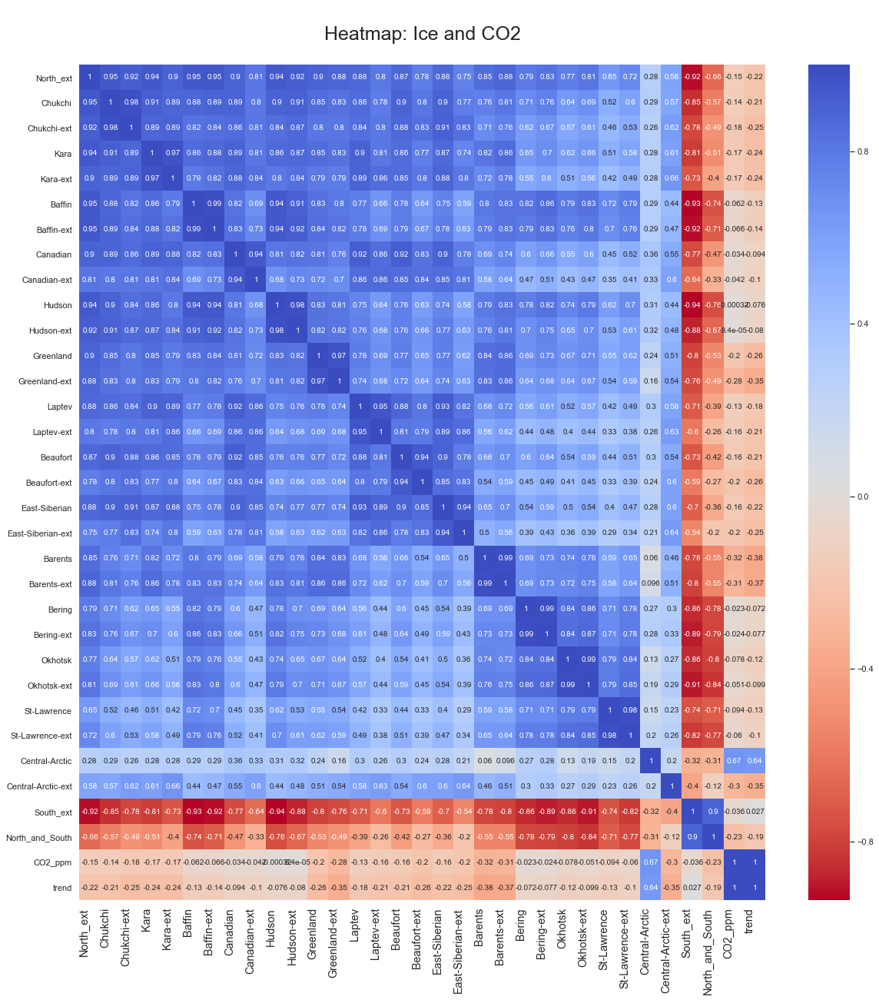

In [36]:
sns.set(font_scale=1.)
plt.figure(figsize=(20,20))
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large'  
)
ax = sns.heatmap(ice_and_co2_original.corr(),cmap='coolwarm_r',annot=True,annot_kws={"size": 10})
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('\nHeatmap: Ice and CO2\n', fontsize=25)

In [37]:
# Since there is such a strong correlation between Northern seas and sea extents, there is no need for 
# a detailed analize for each individual sea for proving the overall correlation
# between CO2 increase and sea ice decrease.

Fire datasets: fire_M6 and fire_V1

In [38]:
# The fire datasets are special. They provide data every few days from the same locations
# because the Earth observing satelites are parked in polar orbits. However, there may be
# missing data, not only due to errors or maintainance time of the instruments
# but because of the cloud cover as well. Therefore, the data must be integrated
# over longer periods of time and wider geographical regions in order to level out
# all these potential issues.

In [39]:
# There are two datasets with the same structure, from different satellites. The first one starts in 2000
# and the second one starts in 2012. The second dataset has a higher resolution.

In [40]:
fire_M6.head(3)

,latitude,longitude,acq_date,frp,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,48.5844,133.8742,2000-11-01,88.4,0.06736,297.40,False,True,False
1,-12.7627,136.3999,2000-11-01,45.7,0.07847,310.75,False,True,False
2,-18.9486,128.7469,2000-11-01,15.1,0.07986,329.40,False,True,False


In [41]:
fire_V1.head(3)

,latitude,longitude,acq_date,frp,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,10.85186,15.22319,2012-01-31,0.9,0.05208,291.40,False,True,False
1,9.86889,4.71216,2012-01-31,1.0,0.05278,300.85,False,True,False
2,9.96840,4.39155,2012-01-31,0.6,0.05278,297.15,False,True,False


In [42]:
fire_M6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817867 entries, 0 to 817866
Data columns (total 9 columns):
latitude             817867 non-null float64
longitude            817867 non-null float64
acq_date             817867 non-null object
frp                  817867 non-null float64
decimal_time         817867 non-null float64
mean_brightness      817867 non-null float64
low_confidence       817867 non-null bool
medium_confidence    817867 non-null bool
high_confidence      817867 non-null bool
dtypes: bool(3), float64(5), object(1)
memory usage: 39.8+ MB


In [43]:
fire_V1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1354135 entries, 0 to 1354134
Data columns (total 9 columns):
latitude             1354135 non-null float64
longitude            1354135 non-null float64
acq_date             1354135 non-null object
frp                  1354135 non-null float64
decimal_time         1354135 non-null float64
mean_brightness      1354135 non-null float64
low_confidence       1354135 non-null bool
medium_confidence    1354135 non-null bool
high_confidence      1354135 non-null bool
dtypes: bool(3), float64(5), object(1)
memory usage: 65.9+ MB


In [44]:
# Use KMeans clustering for identifying clusters for the two datasets

In [45]:
from sklearn.cluster import KMeans

In [46]:
X_M6 = fire_M6[['latitude', 'longitude']]

In [47]:
X_M6

,latitude,longitude
0,48.5844,133.8742
1,-12.7627,136.3999
2,-18.9486,128.7469
3,-25.5181,125.1686
4,-25.3743,125.4813
...,...,...
817862,-11.7730,35.0604
817863,-16.9513,33.7232
817864,-19.3608,31.1849
817865,-19.6013,32.8488


In [48]:
X_V1 = fire_V1[['latitude', 'longitude']]

In [49]:
X_V1

,latitude,longitude
0,10.85186,15.22319
1,9.86889,4.71216
2,9.96840,4.39155
3,10.04201,5.64407
4,10.58989,2.95457
...,...,...
1354130,52.53877,39.61972
1354131,47.74284,35.55166
1354132,46.33746,30.43326
1354133,37.18869,40.12316


In [51]:
n_iterations =100
kmeans_100_lat = []
kmeans_100_long = []
for i in range(n_iterations):
    kmeans = KMeans(n_clusters=2).fit(X_M6)
    centroids = kmeans.cluster_centers_
    print(centroids)
    kmeans_100_lat.append(list(centroids[:,0]))
    kmeans_100_long.append(list(centroids[:,1]))

[[ 20.48529718 109.54318777]
 [  0.2585392   -4.00406879]]
[[  0.28443123  -3.97601589]
 [ 20.43761669 109.6581932 ]]
[[  0.2612695   -4.00110017]
 [ 20.48030276 109.55538317]]
[[ 20.42537851 109.68749958]
 [  0.29104513  -3.96883985]]
[[  0.28459726  -3.97585779]
 [ 20.4372851  109.65886185]]
[[ 20.47905588 109.55866004]
 [  0.26197564  -4.00029176]]
[[  0.25918323  -4.00334328]
 [ 20.48414803 109.54614279]]
[[  0.29104513  -3.96883985]
 [ 20.42537851 109.68749958]]
[[ 20.43679519 109.65986348]
 [  0.284844    -3.97562022]]
[[ 20.43645383 109.66083884]
 [  0.28504521  -3.97537459]]
[[  0.28717632  -3.97303268]
 [ 20.43254573 109.67037455]]
[[  0.26106669  -4.00134426]
 [ 20.4806474  109.55440527]]
[[  0.29310003  -3.96666934]
 [ 20.42150422 109.69641554]]
[[ 20.43663076 109.66050258]
 [  0.28495878  -3.97545305]]
[[ 20.47995161 109.55605679]
 [  0.26144199  -4.0009441 ]]
[[  0.28682164  -3.97343874]
 [ 20.43317806 109.66873776]]
[[  0.284844    -3.97562022]
 [ 20.43679519 109.65986348

In [54]:
from functools import reduce
import operator
lat_list = reduce(operator.concat, kmeans_100_lat)
lon_list = reduce(operator.concat, kmeans_100_long)

# magnitudes are used here just to see the positions of the centroids
mag_list = [1]*n_iterations
# print("\nLatitudes: ",lat_list, "\nLongitudes: ", lon_list, "\nMagnitudes: ", mag_list)

In [56]:
# 2 clusters
import plotly.graph_objects as go
fig = go.Figure(go.Densitymapbox(lat=lat_list, lon=lon_list, z=mag_list, radius=4))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [57]:
# There are only 2 centroids for k=2, as shown above
# Since the centroids vary only by a tiny fraction, there is no need to use KMeans many times
# One random initialisation gives good clustering.

In [58]:
fire_M6_small = fire_M6[::10]

In [59]:
fire_M6_small.head()

,latitude,longitude,acq_date,frp,decimal_time,mean_brightness,low_confidence,medium_confidence,high_confidence
0,48.5844,133.8742,2000-11-01,88.4,0.06736,297.4,False,True,False
10,49.4978,-120.6016,2000-11-01,10.3,0.25764,286.3,False,True,False
20,-22.1502,-63.6294,2000-11-01,32.3,0.62986,315.1,False,True,False
30,22.3081,-81.5419,2000-11-01,5.7,0.68958,303.3,False,True,False
40,-18.8195,126.8343,2000-11-02,39.5,0.10972,318.1,False,True,False


In [61]:
fire_M6_small = fire_M6[::10]
import plotly.graph_objects as go
fig = go.Figure(go.Densitymapbox(lat=fire_M6_small.latitude, lon=fire_M6_small.longitude, z=fire_M6_small.frp, radius=4))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [76]:
# 50 clusters, 10 iterations
n_iterations =10
kmeans_10_lat = []
kmeans_10_long = []
for i in range(n_iterations):
    kmeans = KMeans(n_clusters=50).fit(X_M6)
    centroids = kmeans.cluster_centers_
    #print(centroids)
    print(i)
    kmeans_10_lat.append(list(centroids[:,0]))
    kmeans_10_long.append(list(centroids[:,1]))

0
1
2
3
4
5
6
7
8
9


In [77]:
from functools import reduce
import operator
lat_list = reduce(operator.concat, kmeans_10_lat)
lon_list = reduce(operator.concat, kmeans_10_long)

# magnitudes are used here just to see the positions of the centroids
mag_list = [1]*n_iterations
# print("\nLatitudes: ",lat_list, "\nLongitudes: ", lon_list, "\nMagnitudes: ", mag_list)

In [78]:
import plotly.graph_objects as go
fig = go.Figure(go.Densitymapbox(lat=lat_list, lon=lon_list, z=mag_list, radius=4))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [84]:
# calculate inertia for number of clusters between 2 and 50
inertia = []
for i in range(2, 50):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(X_M6)
    inertia.append(kmeans.inertia_)
    print("k = ", i, " inertia_ = ", kmeans.inertia_)

k =  2  inertia_ =  1757667122.6192896
k =  3  inertia_ =  698561300.9995717
k =  4  inertia_ =  537369070.8159418
k =  5  inertia_ =  384043591.8632414
k =  6  inertia_ =  290609581.83042693
k =  7  inertia_ =  220154548.90040404
k =  8  inertia_ =  177692606.96429768
k =  9  inertia_ =  150462276.8489436
k =  10  inertia_ =  131718467.48470752
k =  11  inertia_ =  113197558.47950095
k =  12  inertia_ =  101951260.89222297
k =  13  inertia_ =  96532134.7763185
k =  14  inertia_ =  86035438.88532986
k =  15  inertia_ =  80262409.94390906
k =  16  inertia_ =  74936682.27057065
k =  17  inertia_ =  71355242.23203634
k =  18  inertia_ =  66311102.70677854
k =  19  inertia_ =  61544113.63209107
k =  20  inertia_ =  58157159.85866308
k =  21  inertia_ =  55907113.74497466
k =  22  inertia_ =  53409192.76362024
k =  23  inertia_ =  48734857.50807522
k =  24  inertia_ =  46555371.969033346
k =  25  inertia_ =  44448134.43757776
k =  26  inertia_ =  41715704.41630422
k =  27  inertia_ =  39493

In [80]:
#print(inertia)

[1757667122.6192896, 698561300.9995717, 537369070.8159418, 384043591.8632414, 290609581.83042693, 220154548.90040404, 177692606.96429768, 150462276.8489436]


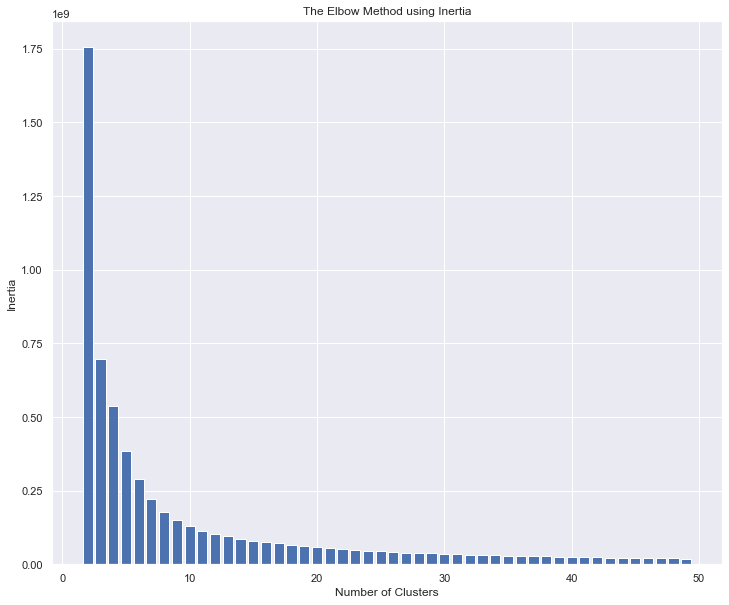

In [85]:
fig = plt.figure(figsize=(12, 10))
k = range(2, 50)
plt.bar(k, inertia) 
plt.xlabel('Number of Clusters') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show()

In [ ]:
# It is difficult to chose a good value for k because there is no "elbow" in the diagram above.
# The reason is that the fires are scattered all around the globe excepting the Arctic and Antarctic regions.
# Possible solutions would be to chose median instead of mean as the kmeans metric and
# discarding the fires that are far away from any determined centroids and are not often in the time series.
# This would eliminate mani fires in remote islands that increase artificially the inertia_

# However, I will chose k=43 for the number of clusters.

# Next, I shall asign cluster numbers from KMeans to the fire_M6 and fire_V1 datasets.
# Then, I shall analyse the annual variation of frp (fire radiative power) for the clusters.
# It makes sense to group the inputs annually in order to eliminate the sesonality.
# Finally, I shall correlate these new features (frp per cluster, annualy) with
# the ones analyzed before (CO2, different seas) and come up with a conclusion.